## Ontario Sunshine List 2020


In this notebook, I want to take a look at Ontario's Sunshine List for 2020. The Sunshine list is a list of people in the public sector who earn more than $100,000 CAD as their annual salary.

Link: https://www.ontario.ca/page/public-sector-salary-disclosure-2020-all-sectors-and-seconded-employees

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
sunshine_df = pd.read_csv("https://files.ontario.ca/pssd/2020/tbs-pssd-compendium-en-2020.csv")

In [3]:
# Preview .csv file:

sunshine_df.head()

,Sector,Last name,First name,Salary paid,Taxable benefits,Employer,Job title,Calendar year
0,Colleges,Aarts,Cheri,"$113,586.57",$71.01,Fanshawe College Of Applied Arts and Technology,Professor,2020
1,Colleges,Aaslepp,Drew,"$113,685.85",$117.26,Humber College Institute Of Technology and Adv...,Professor,2020
2,Colleges,Abba,Corinne,"$102,214.17",$117.36,George Brown College Of Applied Arts and Techn...,Librarian,2020
3,Colleges,Abbott,Brian,"$102,855.46",$117.36,Conestoga College Institute Of Technology and ...,Professor,2020
4,Colleges,Abbott,Kathleen,"$160,854.89",$326.33,George Brown College Of Applied Arts and Techn...,"Associate Dean, Centre for Continuous Learning",2020


In [4]:
# Preview tail part:

sunshine_df.tail()

,Sector,Last name,First name,Salary paid,Taxable benefits,Employer,Job title,Calendar year
205601,Universities,Zylberberg,Joel,"$141,478.88",$727.20,York University,Assistant Professor / Canada Research Chair,2020
205602,Universities,Zylla,Phil,"$127,898.47",$231.93,McMaster Divinity College,Vice President Academic,2020
205603,Universities,Zytaruk,Nicole,"$113,582.77",$231.93,McMaster University,Research Associate,2020
205604,Universities,Zytner,Richard,"$193,168.37","$1,906.08",University Of Guelph,Professor,2020
205605,Universities,Zywno,Malgorzata,"$204,615.20","$1,130.48",Ryerson University,Professor,2020


In [5]:
# Information of dataset:
sunshine_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205606 entries, 0 to 205605
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Sector            205606 non-null  object
 1   Last name         205606 non-null  object
 2   First name        205606 non-null  object
 3   Salary paid       205606 non-null  object
 4   Taxable benefits  205606 non-null  object
 5   Employer          205606 non-null  object
 6   Job title         205606 non-null  object
 7   Calendar year     205606 non-null  int64 
dtypes: int64(1), object(7)
memory usage: 12.5+ MB


From this link: https://www.ontario.ca/page/ontario-demographic-quarterly-highlights-fourth-quarter-2020, Ontario's population in 2020 is 14,733,000. This is about 14.7 million people.

Having 205605 out of 14 733 000 Ontarians is about 1.3955%. The sunshine list people from 2020 is the 1% in Ontario pretty much.

In terms of monetary amounts, 205 605 people on the sunshine list 2020 is at least 20 560 500 000 CAD. This is at least 20.56 Billion Canadian dollars to this Sunshine list of people in 2020.

In [6]:
# Change data type of salary paid and taxable benefits to numeric:
# Replace dollar sign first: https://stackoverflow.com/questions/43096522/remove-dollar-sign-from-entire-python-pandas-dataframe
sunshine_df[["Salary paid", "Taxable benefits"]] = sunshine_df[["Salary paid", "Taxable benefits"]].replace({'\$':''}, 
                                                                                                            regex = True)

In [7]:
# Remove comma.

sunshine_df[["Salary paid", "Taxable benefits"]] = sunshine_df[["Salary paid", "Taxable benefits"]].replace({'\,':''}, 
                                                                                                            regex = True)

In [8]:
sunshine_df[["Salary paid", "Taxable benefits"]] = sunshine_df[["Salary paid", "Taxable benefits"]].apply(pd.to_numeric)

In [9]:
# Check data types.

sunshine_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205606 entries, 0 to 205605
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Sector            205606 non-null  object 
 1   Last name         205606 non-null  object 
 2   First name        205606 non-null  object 
 3   Salary paid       205606 non-null  float64
 4   Taxable benefits  205606 non-null  float64
 5   Employer          205606 non-null  object 
 6   Job title         205606 non-null  object 
 7   Calendar year     205606 non-null  int64  
dtypes: float64(2), int64(1), object(5)
memory usage: 12.5+ MB


## Exploratory Data Analysis

In [10]:
# All The Public Sectors in Dataset

sunshine_df['Sector'].unique()

array(['Colleges', 'Crown Agencies', 'Government of Ontario — Judiciary',
       'Government of Ontario — Legislative Assembly and Offices',
       'Government of Ontario — Ministries',
       'Hospitals & Boards of Public Health', 'Municipalities & Services',
       'Ontario Power Generation', 'Other Public Sector Employers',
       'School Boards', 'Seconded (Attorney General)*',
       'Seconded (Children, Community and Social Services)*',
       'Seconded (Colleges and Universities)*', 'Seconded (Education)*',
       'Seconded (Health)*', 'Seconded (Municipal Affairs and Housing)*',
       'Seconded (Solicitor General)*', 'Universities'], dtype=object)

In [11]:
# Counts of Different Sectors:

sector_counts = pd.DataFrame(sunshine_df['Sector'].value_counts())

sector_counts

,Sector
Municipalities & Services,52507
School Boards,43805
Hospitals & Boards of Public Health,33928
Universities,22020
Government of Ontario — Ministries,18968
Crown Agencies,9332
Ontario Power Generation,8301
Other Public Sector Employers,8055
Colleges,7569
Government of Ontario — Judiciary,580


<AxesSubplot:>

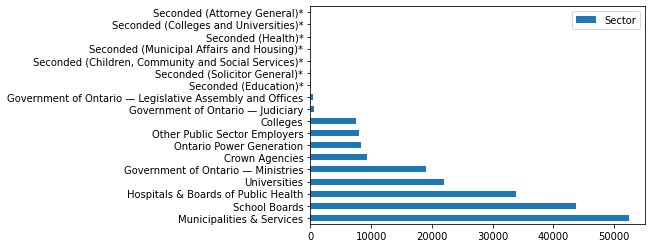

In [12]:
# Simple Bar Graph, could use more modifications to make it more presentable

sector_counts.plot.barh()

In [13]:
# All the different job titles:

sunshine_df['Job title'].unique()

array(['Professor', 'Librarian',
       'Associate Dean, Centre for Continuous Learning', ...,
       'Faculty Graduate Affairs Administrator',
       'Professor and Chair, Immunology',
       'Associate Director, Retail Services/Information Technology Systems'],
      dtype=object)

In [14]:
# Ten most frequent job titles in Sunshine list 2020

job_title_counts = pd.DataFrame(sunshine_df['Job title'].value_counts())

job_title_counts[0:10]

,Job title
Registered Nurse,11540
Professor,7539
Secondary Teacher,7393
Teacher,5003
Constable,4428
Elementary Teacher,4273
Associate Professor,3396
Police Constable,3213
Firefighter,2308
Teacher — Elementary,2249


<AxesSubplot:>

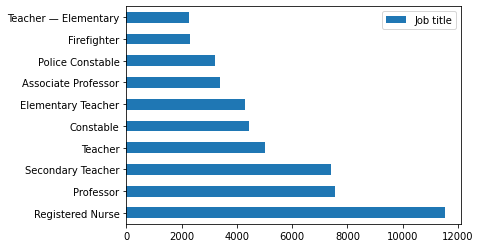

In [15]:
# Bar Graph of Most Frequent Job Titles:

job_title_counts[0:10].plot.barh()

In [16]:
# Top 15 most frequent employers in Sunshine list 2020:

employers_counts = pd.DataFrame(sunshine_df['Employer'].value_counts())

employers_counts[0:15]

,Employer
Ontario Power Generation,8225
City Of Toronto,7239
Peel District School Board,6250
Ontario Provincial Police,5058
University Of Toronto,4728
City Of Toronto — Police Service,4589
Toronto Catholic District School Board,4128
Toronto District School Board,3429
City Of Ottawa,3375
City Of Toronto — Toronto Transit Commission,3171


## Top Employees By Salary

The main reason I wanted to investigate this dataset was to look at some of the salaries of the Sunshine List members.

In [17]:
# Top 15 Public Sector Employees By Salary

sunshine_df.sort_values(by = 'Salary paid', ascending = False).head(n = 15)

,Sector,Last name,First name,Salary paid,Taxable benefits,Employer,Job title,Calendar year
126338,Ontario Power Generation,Hartwick,Kenneth,1228517.00,7539.84,Ontario Power Generation,President and Chief Executive Officer,2020
128464,Ontario Power Generation,Miniere,Dominique,1131767.04,3922.56,Ontario Power Generation,"President, Nuclear",2020
126087,Ontario Power Generation,Granville,Sean,901606.32,2450.88,Ontario Power Generation,Chief Operations Officer and Chief Nuclear Off...,2020
128021,Ontario Power Generation,Martelli,Michael,850332.27,3499.20,Ontario Power Generation,Chief Projects Officer,2020
65308,Hospitals & Boards of Public Health,Smith,Kevin,844992.20,87502.71,University Health Network,President and Chief Executive Officer,2020
127719,Ontario Power Generation,Lockwood,Randy,818891.74,330.24,Ontario Power Generation,Senior Vice President Pickering,2020
129515,Ontario Power Generation,Reiner,Dietmar,817862.24,2298.24,Ontario Power Generation,Senior Vice President Nuclear Projects,2020
10366,Crown Agencies,Fuller,Mark,797474.68,638.17,Ontario Public Service Pension Board (Ontario ...,President and Chief Executive Officer / Présid...,2020
14587,Crown Agencies,Rigby,Stephen,797308.55,1215.72,Ontario Lottery And Gaming Corporation,President and Chief Executive Officer / Présid...,2020
63332,Hospitals & Boards of Public Health,Rutledge,Timothy,776412.00,27974.90,Unity Health Toronto,President And Chief Executive Officer,2020


These 20 people at the top in the Ontario public sector do make a lot of money. They make millions in a few years. 

The top sectors from this top 20 list are Ontario Power Generation, Hospitals & Boards of Public Health.

In [18]:
# Investigate the number of people who make more than 200 000 CAD a year on sunshine list 2020

sunshine_df[sunshine_df['Salary paid'] > 200000]

,Sector,Last name,First name,Salary paid,Taxable benefits,Employer,Job title,Calendar year
14,Colleges,Abiscott,Alexa,225271.54,78.57,Sheridan College Institute Of Technology and A...,General Counsel And Secretary of the Board of ...,2020
30,Colleges,Acosta,Guillermo,203646.00,405.76,Humber College Institute Of Technology and Adv...,"Senior Dean, Faculty of Media and Creative Arts",2020
46,Colleges,Adamson,Maureen,292367.34,10539.06,Sir Sandford Fleming Of Applied Arts and Techn...,President,2020
58,Colleges,Agnew,David,400157.72,17822.32,Seneca College Of Applied Arts and Technology,President,2020
106,Colleges,Allen,James,203839.32,150.66,Centennial College Of Applied Arts and Technology,"Associate Vice President, Information Technology",2020
...,...,...,...,...,...,...,...,...
205589,Universities,Zuniga-Pflucker,Juan Carlos,260673.00,151.08,University Of Toronto,"Professor and Chair, Immunology",2020
205596,Universities,Zweibel,Ellen,200091.68,98.52,University Of Ottawa,Professeur(e) titulaire / Full Professor,2020
205597,Universities,Zweig,David,394416.02,7558.62,University Of Toronto,Professor of Management,2020
205598,Universities,Zwick,Detlev,270199.34,1057.56,York University,Dean / Associate Professor,2020


There are 8566 people on the Sunshine List 2020 who earn more than 200000 CAD. This is about 1.713 Billion or 1,713,200,000 CAD.

In [19]:
# Top 10 Public Sector Employees By Taxable Benefits

sunshine_df.sort_values(by = 'Taxable benefits', ascending = False).head(n = 10)

,Sector,Last name,First name,Salary paid,Taxable benefits,Employer,Job title,Calendar year
61989,Hospitals & Boards of Public Health,Ramalho-Santos,Miguel,256279.95,105014.40,Sinai Health System,"Senior Investigator, Lunenfeld-Tanenbaum Resea...",2020
133519,Other Public Sector Employers,Duguay,Tania,101091.90,101091.90,Timmins Family Counselling Centre Inc,Executive Director/Directrice General,2020
65308,Hospitals & Boards of Public Health,Smith,Kevin,844992.20,87502.71,University Health Network,President and Chief Executive Officer,2020
11580,Crown Agencies,Kanagarajan,Jessei,147089.30,77458.24,Independent Electricity System Operator,Senior Manager Portfolio Operations / Responsa...,2020
203036,Universities,Tettey,Wisdom,293900.04,75501.54,University Of Toronto,"Vice-President, University of Toronto and Prin...",2020
42843,Hospitals & Boards of Public Health,Cohn,Ronald,737013.41,72235.49,The Hospital For Sick Children,President and Chief Executive Officer,2020
134368,Other Public Sector Employers,Habib,George,315361.22,64966.62,Ontario Lung Association,President and Chief Executive Officer,2020
65129,Hospitals & Boards of Public Health,Skot,Janice,465618.93,62713.02,Royal Victoria Regional Health Centre,President and Chief Executive Officer,2020
202742,Universities,Sylvester,David,338538.42,62314.59,University Of St. Michael’s College,President and Vice Chancellor,2020
70494,Hospitals & Boards of Public Health,Zahn,Catherine,704491.29,60454.87,Centre For Addiction And Mental Health,President and Chief Executive Officer / Présid...,2020


These are the top 10 public sector employees with the highest taxable benefits in 2020. The taxable benefit amounts are like annual salaries for some people!

Miguel Ramalho-Santos, Tania Duguay, Kevin Smith, Ronald Cohn and Catherine Zahn have a pretty high salary & taxable benefits.


In [20]:
# Top 10 employees by salary paid and taxabale benefits.

sunshine_df.sort_values(by = ['Salary paid', 'Taxable benefits'], ascending = False).head(n = 10)

,Sector,Last name,First name,Salary paid,Taxable benefits,Employer,Job title,Calendar year
126338,Ontario Power Generation,Hartwick,Kenneth,1228517.00,7539.84,Ontario Power Generation,President and Chief Executive Officer,2020
128464,Ontario Power Generation,Miniere,Dominique,1131767.04,3922.56,Ontario Power Generation,"President, Nuclear",2020
126087,Ontario Power Generation,Granville,Sean,901606.32,2450.88,Ontario Power Generation,Chief Operations Officer and Chief Nuclear Off...,2020
128021,Ontario Power Generation,Martelli,Michael,850332.27,3499.20,Ontario Power Generation,Chief Projects Officer,2020
65308,Hospitals & Boards of Public Health,Smith,Kevin,844992.20,87502.71,University Health Network,President and Chief Executive Officer,2020
127719,Ontario Power Generation,Lockwood,Randy,818891.74,330.24,Ontario Power Generation,Senior Vice President Pickering,2020
129515,Ontario Power Generation,Reiner,Dietmar,817862.24,2298.24,Ontario Power Generation,Senior Vice President Nuclear Projects,2020
10366,Crown Agencies,Fuller,Mark,797474.68,638.17,Ontario Public Service Pension Board (Ontario ...,President and Chief Executive Officer / Présid...,2020
14587,Crown Agencies,Rigby,Stephen,797308.55,1215.72,Ontario Lottery And Gaming Corporation,President and Chief Executive Officer / Présid...,2020
63332,Hospitals & Boards of Public Health,Rutledge,Timothy,776412.00,27974.90,Unity Health Toronto,President And Chief Executive Officer,2020


**Histogram of Salaries**

I am interested in seeing how the salaries are distributed from the Sunshine List 2020.

In [21]:
# Distribution of Salaries:

import plotly.express as px
import numpy as np

fig = px.histogram(sunshine_df, x="Salary paid", nbins = 10)
fig.show()

In [22]:
# Distribution of Salaries, More bins

import plotly.express as px

fig = px.histogram(sunshine_df, x="Salary paid", nbins = 30)
fig.show()

The distribution of salaries from the Ontario Sunshine List 2020 follows a bit of an exponential distribution. There are lot of salaries at 75K-125K and then 125K-175K. Salaries above 175K CAD are way less frequent.

## Top Earning Professors

In [23]:
# Create filtered dataset for professors

profs_df = sunshine_df[sunshine_df['Job title'] == 'Professor']

In [24]:
# Preview:

profs_df.head(10)

,Sector,Last name,First name,Salary paid,Taxable benefits,Employer,Job title,Calendar year
0,Colleges,Aarts,Cheri,113586.57,71.01,Fanshawe College Of Applied Arts and Technology,Professor,2020
1,Colleges,Aaslepp,Drew,113685.85,117.26,Humber College Institute Of Technology and Adv...,Professor,2020
3,Colleges,Abbott,Brian,102855.46,117.36,Conestoga College Institute Of Technology and ...,Professor,2020
5,Colleges,Abbott,Timothy M,119452.26,71.01,Seneca College Of Applied Arts and Technology,Professor,2020
6,Colleges,Abboud,Nadim,116666.07,121.14,Algonquin College Of Applied Arts and Technology,Professor,2020
8,Colleges,Abdallah,Mykul,103042.39,71.02,Mohawk College Of Applied Arts and Technology,Professor,2020
9,Colleges,Abdi,Farhia,102214.17,117.36,George Brown College Of Applied Arts and Techn...,Professor,2020
10,Colleges,Abdulla,Dalya,110990.80,367.36,Sheridan College Institute Of Technology and A...,Professor,2020
11,Colleges,Abdulla,Mouhamed,109888.06,367.36,Sheridan College Institute Of Technology and A...,Professor,2020
12,Colleges,Abel,Randy,108701.18,367.36,Sheridan College Institute Of Technology and A...,Professor,2020


In [25]:
# Top 15 professors by salary paid and taxabale benefits.

profs_df.sort_values(by = ['Salary paid', 'Taxable benefits'], ascending = False).head(n = 15)

,Sector,Last name,First name,Salary paid,Taxable benefits,Employer,Job title,Calendar year
200046,Universities,Reznick,Richard,509345.04,292.14,Queen’s University,Professor,2020
200978,Universities,Saunders,David,489525.88,292.14,Queen’s University,Professor,2020
205318,Universities,Yusuf,Salim,482274.86,1270.12,McMaster University,Professor,2020
204655,Universities,Williamson,Stephen,442127.10,61.16,University Of Western Ontario,Professor,2020
198449,Universities,Orbinski,James,420042.52,1057.56,York University,Professor,2020
185064,Universities,Belk,Russell W,388261.52,0.00,York University,Professor,2020
193754,Universities,Kipping,Matthias,386408.08,1057.56,York University,Professor,2020
187795,Universities,Culham,Richard J.,383932.76,277.08,University Of Waterloo,Professor,2020
196997,Universities,Mikrogianakis,Angelo,382686.98,231.93,McMaster University,Professor,2020
185300,Universities,Bhatia,Mick,378047.19,347.95,McMaster University,Professor,2020


In [26]:
# Bottom 10 professors by salary paid and taxabale benefits on Sunshine List 2020

profs_df.sort_values(by = ['Salary paid', 'Taxable benefits'], ascending = True).head(n = 10)

,Sector,Last name,First name,Salary paid,Taxable benefits,Employer,Job title,Calendar year
7419,Colleges,Woods-Powell,Jacqui,100053.02,71.28,Georgian College Of Applied Arts and Technology,Professor,2020
5153,Colleges,Oner,Erin,100095.84,117.26,Confederation College Of Applied Arts and Tech...,Professor,2020
1152,Colleges,Charbonneau,Sandra,100138.03,117.26,Mohawk College Of Applied Arts and Technology,Professor,2020
6501,Colleges,Sprentz,Paul,100140.10,117.26,Mohawk College Of Applied Arts and Technology,Professor,2020
471,Colleges,Beddage,Shirantha,100184.75,71.02,Humber College Institute Of Technology and Adv...,Professor,2020
1448,Colleges,Cramer,Anne,100184.75,71.02,Humber College Institute Of Technology and Adv...,Professor,2020
1720,Colleges,Di Placito,Maria Lucia,100184.75,71.02,Humber College Institute Of Technology and Adv...,Professor,2020
3463,Colleges,Kedzior,Marcin,100184.75,71.02,Humber College Institute Of Technology and Adv...,Professor,2020
5620,Colleges,Rahou,Amar,100184.75,71.02,Humber College Institute Of Technology and Adv...,Professor,2020
445,Colleges,Bear,Daniel,100184.75,117.26,Humber College Institute Of Technology and Adv...,Professor,2020


The bottom earners for Professors are just over 100,000 CAD. These professors work at colleges instead of universities.